In [1]:
import argparse
import copy
import os
import sys
import csv
from typing import Callable, Dict, List, Optional, Tuple, Union
from datetime import datetime
from PIL import Image
from tqdm.notebook import tqdm

sys.path.append(os.path.join(os.getcwd(), ".."))

import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms.functional import center_crop

from src.utils import (
    load_config,
    tensor2img,
    deterministic,
    create_grid,
)
from src.diffusion_util import (
    ddim_sample_loop_x0,
    ddim_sample_loop_find_and_correct,
)

from guided_diffusion.guided_diffusion.gaussian_diffusion import (
    GaussianDiffusion,
)
from guided_diffusion.guided_diffusion.unet import EncoderUNetModel
from guided_diffusion.guided_diffusion.script_util import (
    model_and_diffusion_defaults,
    create_model_and_diffusion,
    add_dict_to_argparser,
    args_to_dict,
)

In [2]:
class NoiseDataset(Dataset):
    def __init__(
        self, noise_dir: str, num_samples: Optional[int], image_size: int = 256
    ) -> None:
        self.noise_files = [
            f for f in os.listdir(noise_dir) if f.endswith(".npy")
        ]
        self.noise_files.sort(key=lambda x: int(x.split("_")[1].split(".")[0]))
        if num_samples is not None:
            self.noise_files = self.noise_files[:num_samples]
        self.noise_dir = noise_dir
        self.image_size = image_size

    def __len__(self) -> int:
        return len(self.noise_files)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, str]:
        noise_file = self.noise_files[idx]
        noise_path = os.path.join(self.noise_dir, noise_file)
        noise_tensor = torch.from_numpy(np.load(noise_path)).float()
        if self.image_size < noise_tensor.shape[-1]:
            noise_tensor = center_crop(
                noise_tensor, [self.image_size, self.image_size]
            )
        return noise_tensor, noise_file


def create_args(args):
    defaults = load_config(args["config"])
    args.update(defaults)
    
    return argparse.Namespace(**args)


def get_model_and_diffusion(
    args: argparse.Namespace, device: Union[str, torch.device]
) -> Tuple[nn.Module, GaussianDiffusion]:
    model, diffusion = create_model_and_diffusion(
        **args_to_dict(args, model_and_diffusion_defaults().keys())
    )
    model.load_state_dict(torch.load(args.model_path))
    model.to(device)
    model.eval()
    return model, diffusion

In [3]:
def create_args(args):
    defaults = load_config(args["config"])
    args.update(defaults)
    
    return argparse.Namespace(**args)


def get_model_and_diffusion(
    args: argparse.Namespace, device: Union[str, torch.device]
) -> Tuple[nn.Module, GaussianDiffusion]:
    model, diffusion = create_model_and_diffusion(
        **args_to_dict(args, model_and_diffusion_defaults().keys())
    )
    model.load_state_dict(torch.load(args.model_path))
    model.to(device)
    model.eval()
    return model, diffusion

In [4]:
def display_images_grid(x0_list, x0_list_10, asced_corrected_1, asced_corrected_2, asced_corrected_3, noise_names):
    num_images = len(noise_names)
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 5*num_images))
   
    if num_images == 1:
        axes = axes.reshape(1, -1)
   
    titles = ['Original', 'Path', 'ASCED-1', 'ASCED-2', 'ASCED-3']
   
    for row in range(num_images):
        images = [
           tensor2img(x0_list[row:row+1])[0],
           tensor2img(x0_list_10[row:row+1])[0],
           tensor2img(asced_corrected_1[row:row+1])[0],
           tensor2img(asced_corrected_2[row:row+1])[0],
           tensor2img(asced_corrected_3[row:row+1])[0]
        ]
       
        fig.text(0.01, axes[row, 0].get_position().y0 + axes[row, 0].get_position().height/2, 
               noise_names[row], va='center', ha='right', fontsize=10)
       
        for col, (img, title) in enumerate(zip(images, titles)):
            axes[row, col].imshow(img)
            axes[row, col].axis('off')
            if row == 0:
                axes[row, col].set_title(title)
   
    plt.tight_layout()


In [5]:
args = {
        "config": "../configs/ffhq_256.yaml",
        "noise_dir": "../datasets/noise",
        "expand_mask": 15,
        "classification_t": 12,
        "classification_start": 5,
        "threshold_method": "mad",
        "mad_scale": 6,
        "min_size": 500,
        "max_size": 10000,
        "reverse_step": 2,
        "narrow_width": 1,
        "noise_ptb_scale": 1.0,
        "correct_eta": 0.0,
        "correct_mode": "reverse",
        "save_mode": "all",
        "artifact_step_ovl_min": 100,
        "artifact_step_ovl_pct": 0.1
    }

args = create_args(args)
args.model_path = "../checkpoints/ddpm/ffhq.pt"
args.batch_size = 10
args.num_samples = 50


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model, diffusion = get_model_and_diffusion(args, device)
cond_fn = None
rng = None

In [7]:
def model_fn(
    x: torch.Tensor, t: torch.Tensor, y: Optional[torch.Tensor] = None
) -> torch.Tensor:
    return model(x, t, None)
img_shape = (args.batch_size, 3, args.image_size, args.image_size)

In [8]:
noise_dataset = NoiseDataset(
    args.noise_dir, args.num_samples, args.image_size
)
noise_dataloader = DataLoader(
    noise_dataset, batch_size=args.batch_size, shuffle=False
)
noise_dataloader = iter(noise_dataloader)

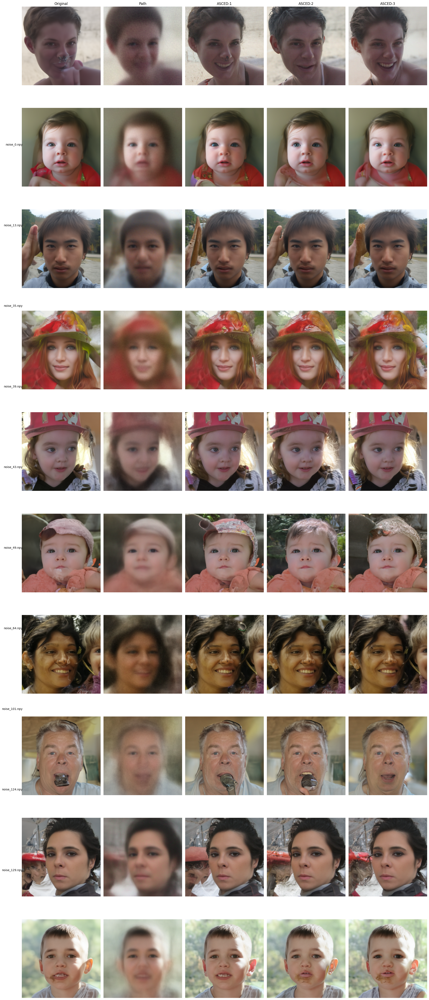

In [9]:
deterministic(2024)
noises, noise_names = next(noise_dataloader)
noises = noises.to(device)
model_kwargs = {}

asced_corrected_1 = (
    ddim_sample_loop_find_and_correct(
        args,
        diffusion,
        model_fn,
        img_shape,
        noise=noises,
        clip_denoised=args.clip_denoised,
        model_kwargs=model_kwargs,
        cond_fn=cond_fn,
        device=device,
        progress=False,
    )
)

asced_corrected_2 = (
    ddim_sample_loop_find_and_correct(
        args,
        diffusion,
        model_fn,
        img_shape,
        noise=noises,
        clip_denoised=args.clip_denoised,
        model_kwargs=model_kwargs,
        cond_fn=cond_fn,
        device=device,
        progress=False,
    )
)

asced_corrected_3 = (
    ddim_sample_loop_find_and_correct(
        args,
        diffusion,
        model_fn,
        img_shape,
        noise=noises,
        clip_denoised=args.clip_denoised,
        model_kwargs=model_kwargs,
        cond_fn=cond_fn,
        device=device,
        progress=False,
    )
)

x0_list = ddim_sample_loop_x0(
    diffusion,
    model_fn,
    img_shape,
    noise=noises,
    clip_denoised=args.clip_denoised,
    cond_fn=cond_fn,
    model_kwargs=model_kwargs,
    device=device,
    progress=False,
)

display_images_grid(x0_list[-1], x0_list[-18], asced_corrected_1, asced_corrected_2, asced_corrected_3, noise_names)
